## Introduction to Computer Vision

##What is Computer Vision?

Computer vision is part of artificial intelligence (AI), as it seeks to model human vision, with the intention of replicating its functions through technology. It allows computers and systems to extract meaningful information from digital images, videos, and other visual inputs and act or make recommendations based on that information. If AI allows computers to think, machine vision allows them to see, observe, and understand.

Machine vision works much like human vision, except that humans have a lifetime of context to train them to distinguish objects, how far away they are, whether they are moving, and whether something is wrong with an image.

Computer vision trains machines to perform these functions, but it needs to do so in much less time, using cameras, data, and algorithms instead of retinas, optic nerves, and the visual cortex. However, because a system trained to inspect products or visualize a production asset can analyze thousands of products or processes per minute, detecting defects or imperceptible problems, it can quickly surpass human capabilities. This is a tremendous advantage!

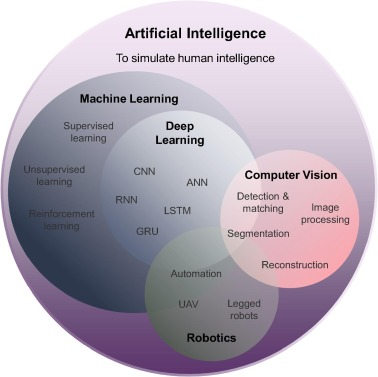

#Digital Image Processing

Image processing involves manipulating an image using computer programs to improve its quality. It's often used to correct photos. However, this process isn't just about aesthetic improvements—it can also facilitate the extraction of specific information from the image for later analysis by computer vision algorithms.


## Computer Vision x Image Processing

Digital image processing can prepare the image to facilitate the application of computer vision methods, which analyze and interpret the image content and obtain relevant information. Thus, processing is one of the stages in the operation of a computer vision system.

We can understand both processes as algorithms with input and output variables. In image processing, the input is an image, and the output is another image with specific modifications. In computer vision, the input is also an image, but the output consists of information about what is happening in the scene and its elements.


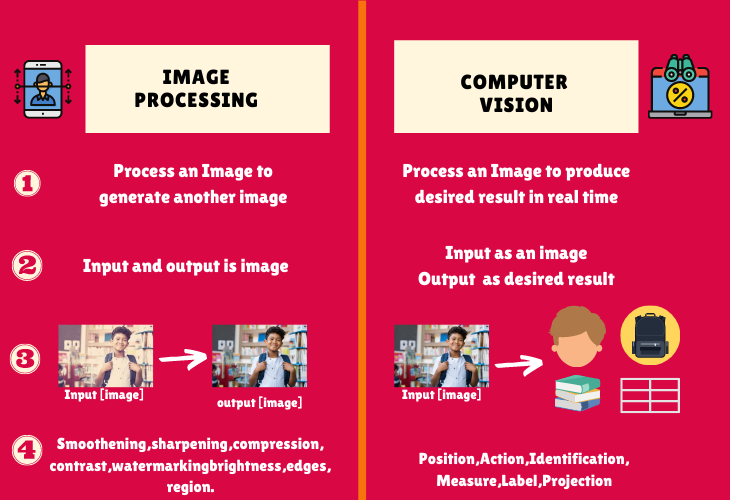

# Computer Vision Applications in Remote Sensing Images

Computer Vision is a branch of Artificial Intelligence that seeks to enable computers to understand and interpret visual information. When applied to remote sensing images, Computer Vision can play an important role in several areas. Here are some common applications:

- Terrain Classification: Remote sensing images typically capture information about the Earth's surface. Through Computer Vision, it is possible to classify different types of terrain, such as urban areas, forests, bodies of water, agricultural fields, among others. This can be useful for mapping and environmental monitoring.

- Change Detection: By analyzing remote sensing images captured at different times, Computer Vision techniques can be used to detect changes in the landscape. This can be applied to monitoring deforestation, identifying areas affected by natural disasters, tracking urban growth, among others.

- Object Identification: Computer Vision can be used to identify and locate specific objects in remote sensing images. For example, it is possible to detect and track vehicles, buildings, ships, aircraft, power lines, and other elements of interest.

- Vegetation Coverage Analysis: Using Computer Vision techniques, it is possible to analyze remote sensing images to obtain information about vegetation cover, such as forest detection, vegetation index calculation, crop monitoring, plant species identification, and more.

- Image Segmentation: Image segmentation is an important Computer Vision technique that allows an image to be divided into distinct regions or objects. This can be applied to remote sensing images to separate different elements of the scene, such as bodies of water, urban areas, vegetation, and others.

These are just some of the many applications of Computer Vision in remote sensing images. As technology advances, new techniques and applications continue to emerge, enabling better understanding and analysis of these images for a wide range of purposes.

#Main areas of application of Computer Vision in Drone and Satellite images

Computer vision in drone and satellite imagery has a wide range of applications in various fields. Here are some of the main areas where computer vision is applied to these images:



Environmental Monitoring: Computer Vision is used to monitor the environment, such as detecting deforestation, analyzing land cover, monitoring water resources, monitoring climate change, detecting forest fires, among others.



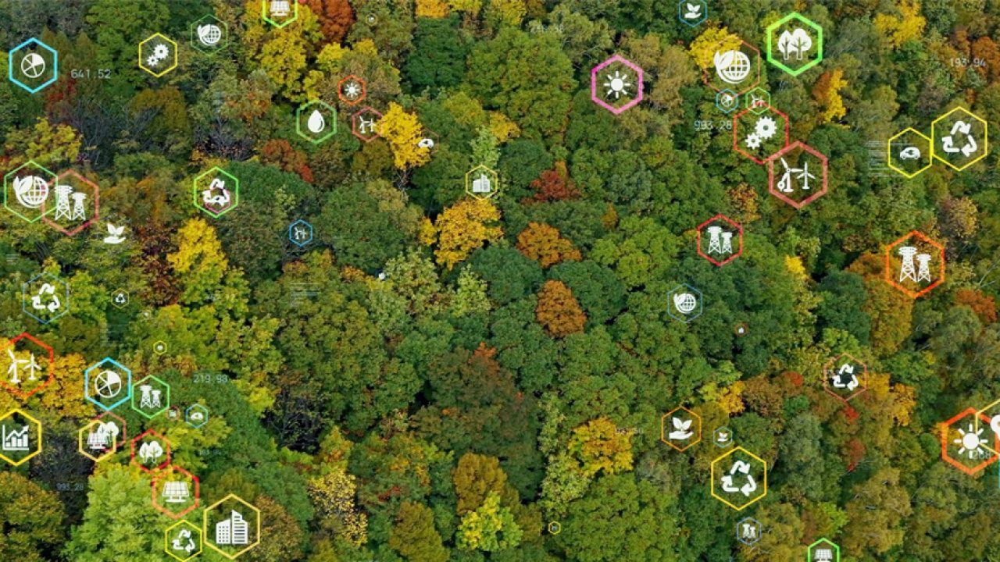

Precision Agriculture: Computer Vision is applied to monitor crop growth, detect diseases and pests, estimate plant health, optimize the use of fertilizers and water resources, perform plant and fruit counting, among other applications related to agriculture.


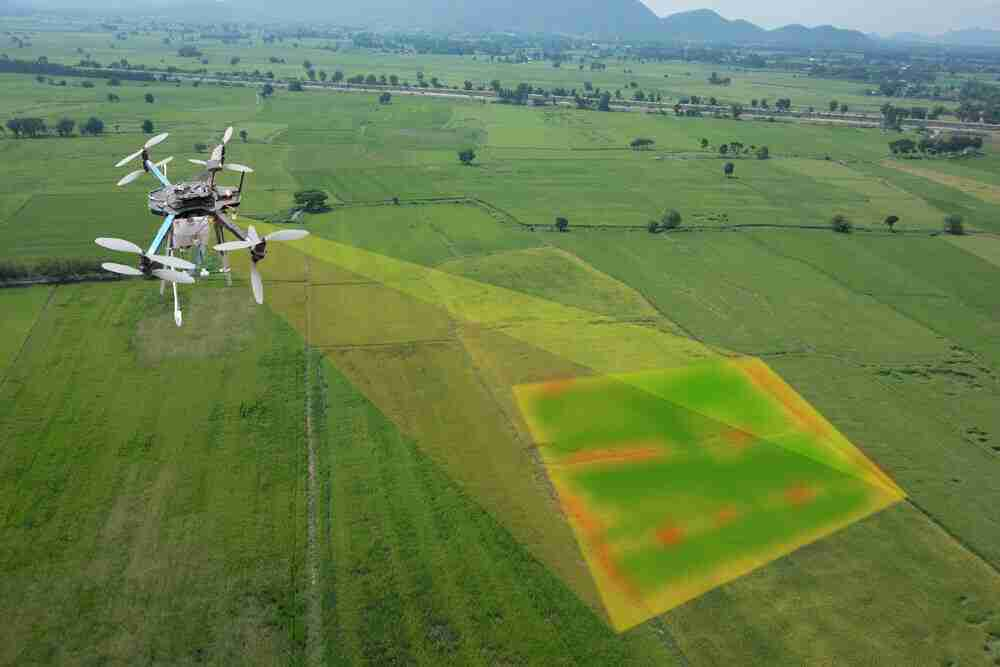

Urban Planning: Computer Vision is used for mapping urban areas, analyzing urban growth, detecting and classifying infrastructure, monitoring traffic and transportation, planning public spaces, monitoring construction and inspecting infrastructure.


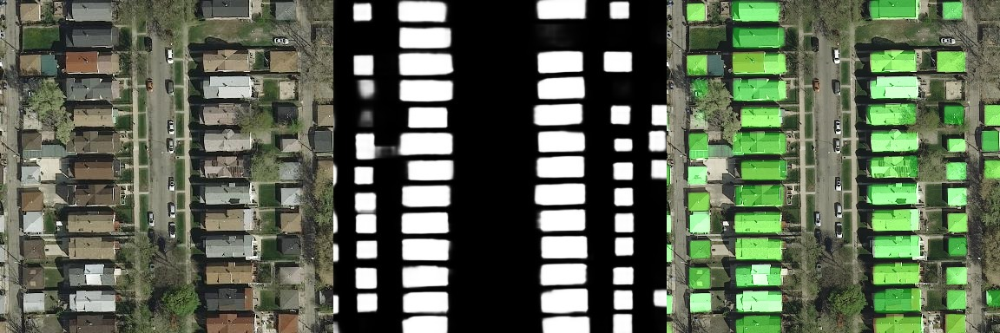

Natural disaster monitoring: Computer vision is used to detect areas affected by natural disasters, such as floods, earthquakes, hurricanes, landslides, and others. This can aid emergency response operations and damage assessment.



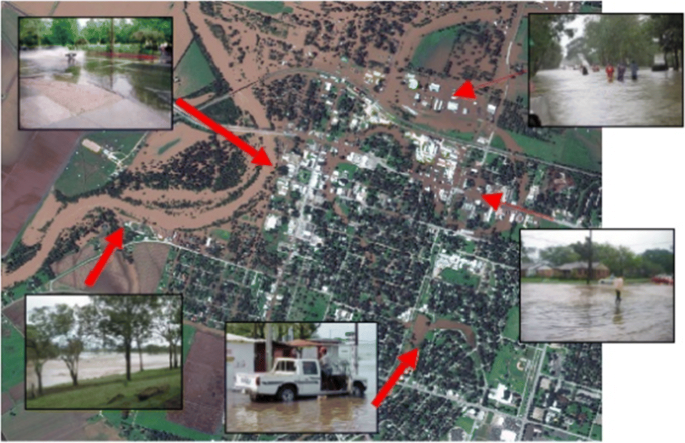

Security and Defense: Computer Vision is used for surveillance and monitoring of sensitive areas, detection of suspicious activities, real-time object tracking, target identification, facial recognition and border control.



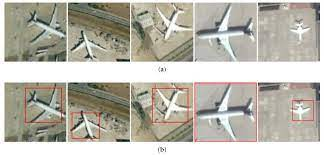

Infrastructure inspection: Computer vision is applied to inspect infrastructure such as power lines, pipelines, bridges, buildings, and other structures. This can help identify damage, perform safety analyses, and assess the need for maintenance or repairs.



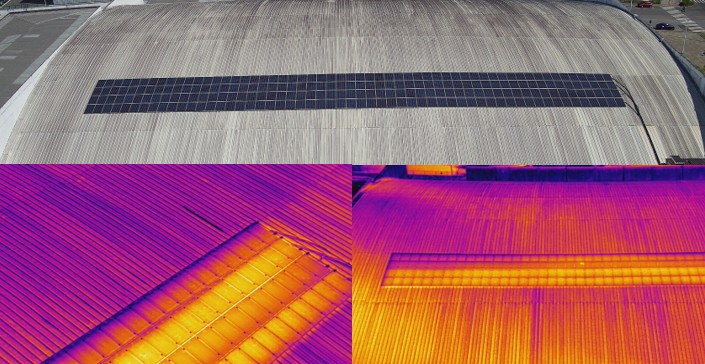

#Using Computer Vision Algorithms for Plant Detection and Counting

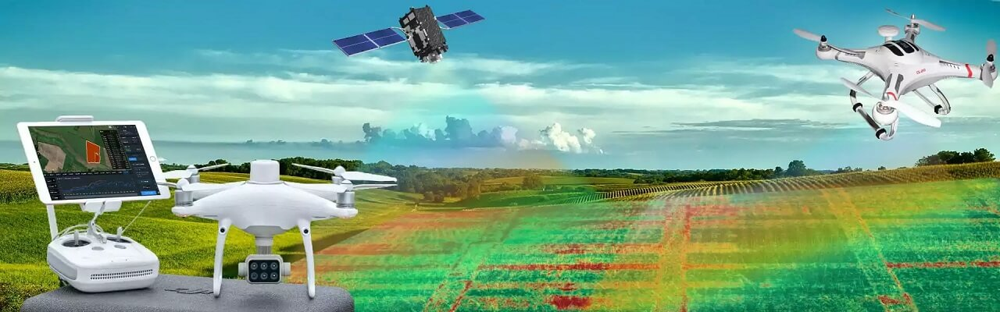

Morphological operations are widely used techniques in image processing for detecting and counting objects, including plants, in drone images. Here's a general overview of how you can use morphological operations for this purpose:

- Image preprocessing: Before applying morphological operations, it is recommended to perform preprocessing steps on the image to improve the quality of the results. This may include noise reduction with a smoothing filter, such as the Gaussian filter, and image segmentation to highlight regions of interest, such as plants.

- Image binarization: Binarization is the process of converting the image into a black-and-white image, where objects of interest are represented as white pixels and the background as black pixels. Different binarization methods are available, such as the Otsu method or the application of a fixed threshold. The method chosen will depend on the image characteristics.

- Morphological operations: The two most commonly used morphological operations for plant detection and counting are erosion and dilation.

- Erosion: Erosion is used to remove fine details and noise from the binary image. It wears away the edges of objects, reducing their size. By applying erosion, small objects, such as small spots or noise, disappear, while larger objects, such as plants, are preserved.

- Dilation: Dilation is used to fill in holes and increase the size of objects in the binary image. It expands the edges of objects, making them larger. By applying dilation, the objects become more cohesive and connected.

- These operations can be applied sequentially to improve plant segmentation. The order of application may vary depending on the image and the desired result. Multiple iterations of erosion and dilation can be performed to achieve the desired result.

- Plant detection and counting: After applying morphological operations, you can identify regions of interest that correspond to plants in the resulting binary image. There are several approaches you can take to detect and count plants:

- Connected components: Using connected component labeling algorithms, you can identify connected regions of white pixels in the binary image. Each identified region represents a plant.

- Object Counting: You can use object counting algorithms to identify and count the objects detected in the binary image. These algorithms can count the number of regions or segments in the image, each representing a plant.

Remember to adjust the parameters of the morphological operations, such as the size of the structuring element used in erosion and dilation, to adapt them to the size and shape of the plants you are trying to detect.

Let's start by installing rasterio.

In [ ]:
!pip install rasterio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Now, let's connect Drive to access the files that will be used:

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


We install the libraries that we are going to use

In [ ]:
import geopandas as gpd
import numpy as np
import pandas as pd
import shapely
import math
import os
import rasterio
from rasterio.mask import mask
import json
from rasterio.plot import show
import matplotlib.pyplot as plt
import cv2

Link to dataset: https://drive.google.com/file/d/1Dqp2cJQwvUcGP1ztkJN6jzydBTZdXRwg/view?usp=sharing

Then we set the path of the image we are going to use:

In [ ]:
path_img = '/content/drive/MyDrive/Datasets/Rice Detection/test_img.tif'

With rasterio we open the image and plot it with matplotlib:

In [ ]:
src = rasterio.open(path_img)

In [ ]:
img = src.read()

In [ ]:
img.shape

(4, 741, 1230)

In [ ]:
img = img.transpose([1,2,0])

In [ ]:
img.shape

(741, 1230, 4)

In [ ]:
img = img.astype('uint8')

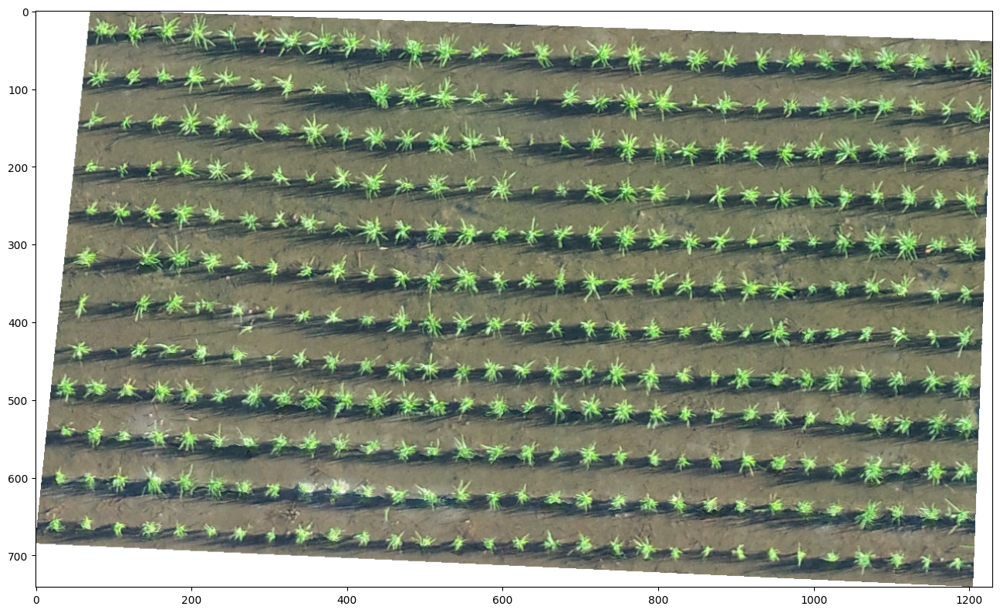

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(img)

In our RGB image we will separate the spectral bands into the R, G, B channels.

In [ ]:
R = img[:,:,0]
G = img[:,:,1]
B = img[:,:,2]

And plot only the G channel, with a 'RdYlGn' colormap:

(-0.5, 1229.5, 740.5, -0.5)

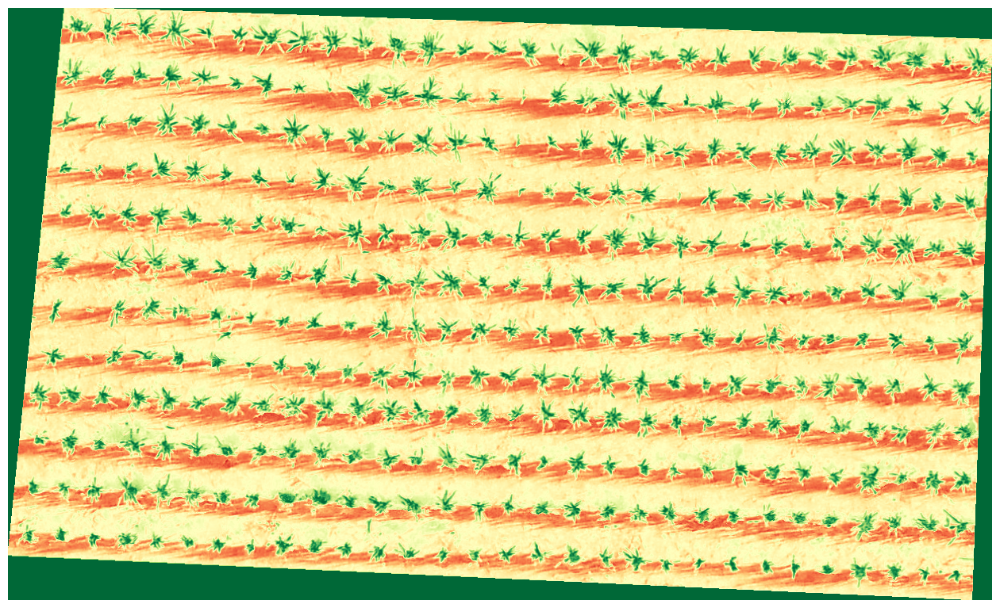

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(G,cmap='RdYlGn')
plt.axis('off')

We'll use this channel to binarize the image. First, let's convert the edge values, which are currently 255, to 0.

In [ ]:
G = np.where(G == 255,0,G)

To binarize the image, we will use the otsu algorithm.

In [ ]:
from skimage.filters import threshold_multiotsu

In [ ]:
thresh = threshold_multiotsu(G)

In [ ]:
thresh

array([ 80, 162])

From the value found, we will use it as a threshold to binarize the image:

In [ ]:
binary = G > thresh[1]

(-0.5, 1229.5, 740.5, -0.5)

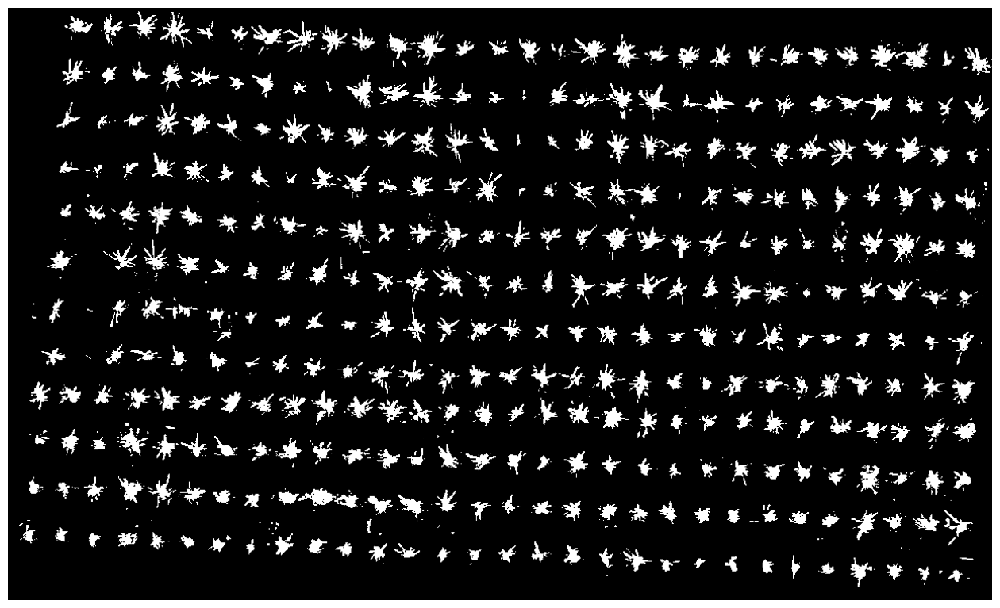

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(binary,cmap=plt.cm.gray)
plt.axis('off')

With the binarized image, we will apply erosion and dilation operations to remove noise and create more concise areas.

In [ ]:
binary = binary.astype('uint8')

In [ ]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))

horizontal = cv2.dilate(binary, kernel, iterations = 3)
horizontal = cv2.erode(horizontal, kernel,  iterations = 6)
horizontal = cv2.dilate(horizontal, kernel, iterations = 4)
horizontal = cv2.erode(horizontal, kernel,  iterations = 6)


(-0.5, 1229.5, 740.5, -0.5)

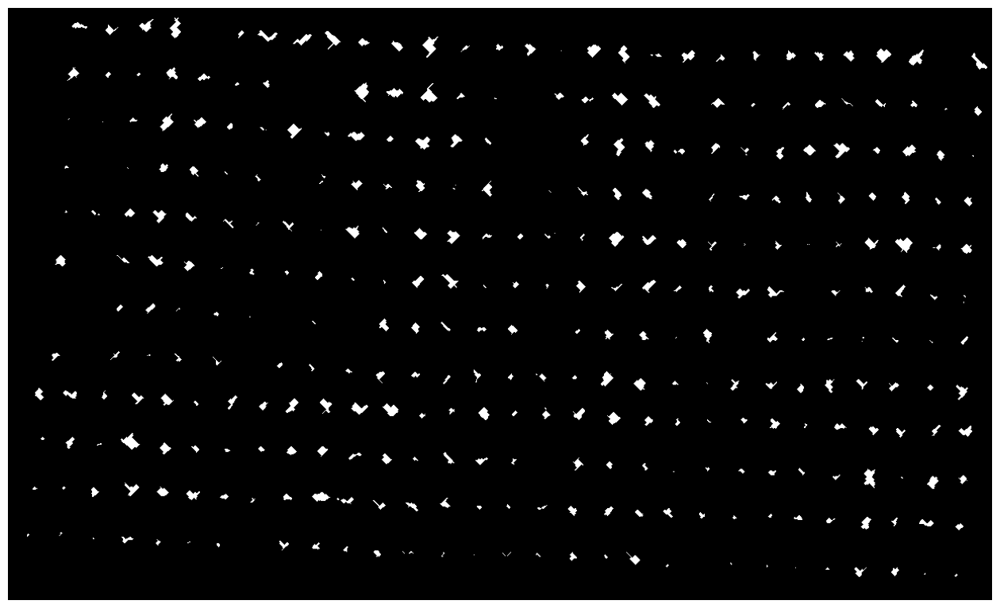

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(horizontal,cmap=plt.cm.gray)
plt.axis('off')

The next step is to get each component of the image and get the count:

In [ ]:
num_labels, labels_im = cv2.connectedComponents(horizontal)

In [ ]:
num_labels

346

(-0.5, 1229.5, 740.5, -0.5)

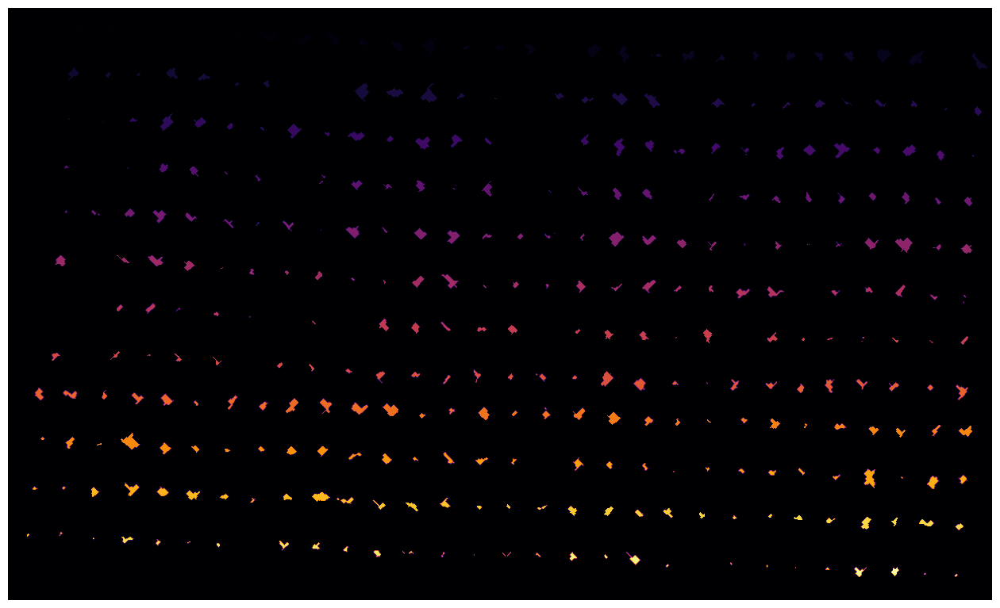

In [ ]:
plt.figure(figsize=[16,16])
plt.imshow(labels_im,cmap='inferno')
plt.axis('off')

This way, we can obtain the location of each object in the image. Let's plot the bounding box for each object:

In [ ]:
import matplotlib.patches as mpatches

from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb

In [ ]:
label_image = label(horizontal)

In [ ]:
img = img[:,:,0:3]

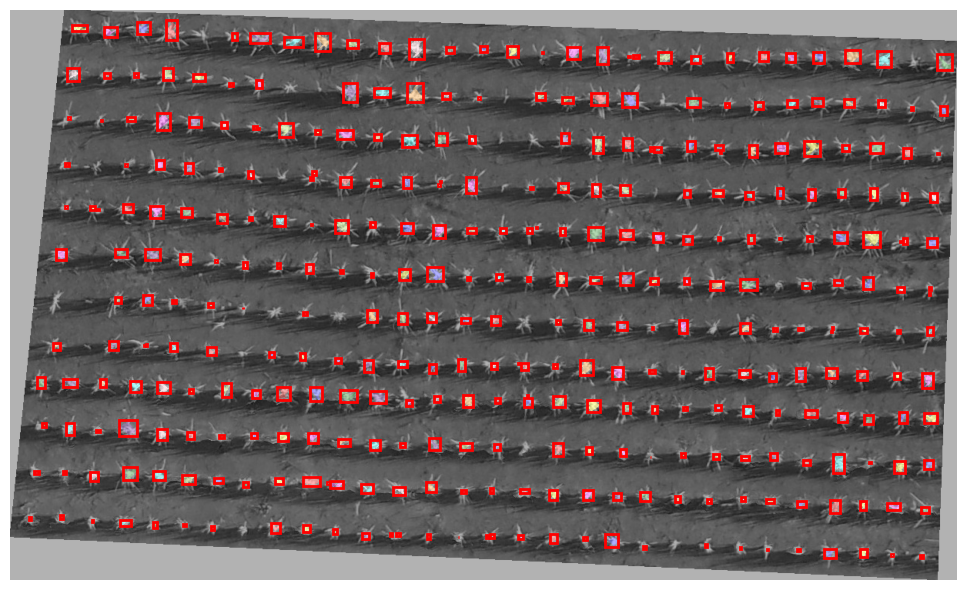

In [ ]:
image_label_overlay = label2rgb(label_image, image=img, bg_label=0)

fig, ax = plt.subplots(figsize=(10, 6))
ax.imshow(image_label_overlay)

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 1:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

ax.set_axis_off()
plt.tight_layout()
plt.show()

So, with rasterio, we can convert the center point into latitude and longitude values:

In [ ]:
ls_x = []
ls_y = []
for region in regionprops(label_image):
    if region.area >= 1:
      y0, x0 = region.centroid
      xs, ys = rasterio.transform.xy(src.transform, y0, x0)
      ls_x.append(xs)
      ls_y.append(ys)

We create a DataFrame to store these values, and then a GeoDataFrame.

In [ ]:
df_xy = pd.DataFrame([])
df_xy['x'] = ls_x
df_xy['y'] = ls_y

In [ ]:
gdf = gpd.GeoDataFrame(df_xy, geometry=gpd.points_from_xy(df_xy['x'], df_xy['y']))

In [ ]:
gdf = gdf.set_crs(src.crs.to_dict()['init'])

Finally, we plot the points together with the georeferenced image:

<Axes: >

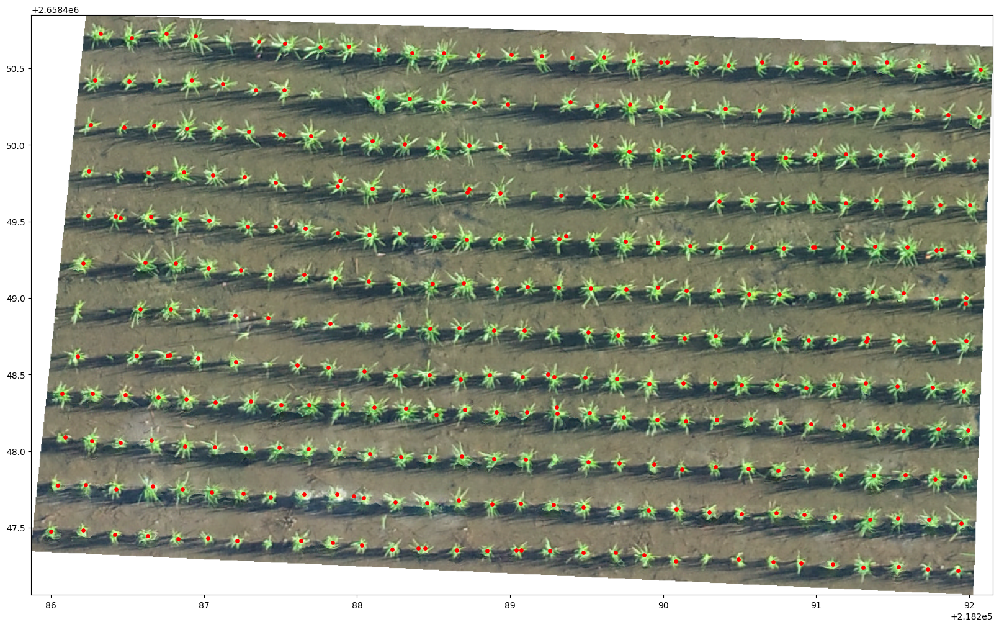

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
show((src), ax=ax)
gdf.plot(ax=ax,  marker='o', color='red', markersize=15)

We can save the file as a shapefile and download it:

In [ ]:
if not os.path.isdir('/content/shapefile'):
    os.mkdir('/content/shapefile')

In [ ]:
gdf.to_file("/content/shapefile/Plants.shp")

In [ ]:
!zip -r /content/shapefile.zip /content/shapefile
from google.colab import files
files.download("/content/shapefile.zip")

updating: content/shapefile/ (stored 0%)
updating: content/shapefile/Plants.cpg (stored 0%)
updating: content/shapefile/Plants.shp (deflated 52%)
updating: content/shapefile/Plants.prj (deflated 36%)
updating: content/shapefile/Plants.shx (deflated 73%)
updating: content/shapefile/Plants.dbf (deflated 61%)


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>